# Introduction to Reservoir Computing with ReservoirPy


**Nathan Trouvain <br>
Inria, IMN, LaBRI - Bordeaux, France**

<br>
<br>
<br>
UCLA - November 14th 2023

In [3]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
import reservoirpy as rpy
from reservoirpy.observables import nrmse, rsquare

from IPython.display import Image
from IPython.core.display import HTML
HTML("""
<style>
.img-center {
    display: block;
    margin-left: auto;
    margin-right: auto;
    }
.output_png {
    display: table-cell;
    text-align: center;
    vertical-align: middle;
    }
</style>
""")

rpy.verbosity(0)
rpy.set_seed(42)

## Table of content

- <a href="#concepts">Key conceptss</a>
- <a href="#pred">Timeseries prediction</a>
- <a href="#gen">Learned attractors and generative capabilities</a>
- <a href="#online">Online learning</a>
- <a href="#hyper">Understanding hyperparameters</a>
- <a href="#chapitre4">Use Case demo - falling robot</a>
- <a href="#chapitre5">Use Case demo - canary songs transcriber</a>

## Key oncepts and features <a id="concepts"></a>


- Numpy, Scipy, and that's it!
- Efficient execution (distributed implementation)
- *Online* and *offline* learning rules
- Complex model architectures enabled

- Documentation: https://reservoirpy.readthedocs.io/en/latest/
- GitHub: https://github.com/reservoirpy/reservoirpy

## General info

- Everything is NumPy (and more generally "standard" scientific Python)
- First axis of arrays is always representing time.

## Timeseries prediction <span id="pred"/>

**The Lorenz attractor**

$$
\begin{split}
    \dot{x}(t) &= \sigma (y(t) - x(t)) \\
    \dot{y}(t) &= \rho x(t) - y(t) - x(t)z(t) \\
    \dot{z}(t) &= x(t)y(t) - \beta z(t)
\end{split}
$$

- describes convection movements in a fluid. **Highly chaotic!**

In [4]:
from reservoirpy.datasets import lorenz

timesteps = 3000
X = lorenz(timesteps, x0=[17.67, 12.93, 43.91])

In [5]:
def plot_lorenz(X, sample):

    x, y, z = X[:, 0], X[:, 1], X[:, 2]
    fig = plt.figure(figsize=(13, 5))
    N = sample

    ax = plt.subplot((121))
    plt.title(f"Timeseries - {sample} steps")
    t = np.linspace(0, N, N)
    for i in range(N-1):
        ax.plot(t[i:i+2], x[i:i+2], color=plt.cm.magma(255*i//N), lw=1.0)

    plt.xlabel("$t$")
    plt.ylabel("$x(t)$")

    ax2 = plt.subplot((122),  projection="3d")
    ax2.margins(0.05)
    for i in range(N-1):
        ax2.plot(x[i:i+2], y[i:i+2], z[i:i+2], color=plt.cm.magma(255*i//N), lw=1.0)
    ax2.set_xlabel("$x(t)$")
    ax2.set_ylabel("$y(t)$")
    ax2.set_zlabel("$z(t)$")


    plt.tight_layout()
    plt.show()

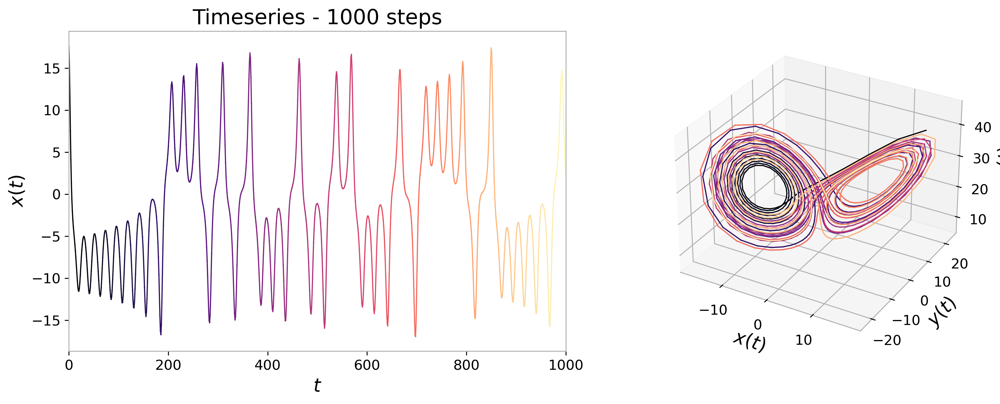

In [6]:
plot_lorenz(X, 1000)

Knowing series value at timestep $t$:
- How can we predict $t+1$, $t+100$...?
- How can we predict $t+1$, $t+2$, $\dots$, $t+n$ ?

### 10-steps ahead forecasting

Predict $P(t + 10)$ knowing $P(t)$.

In [7]:
def plot_train_test(X_train, y_train, X_test, y_test):
    sample = 500
    test_len = X_test.shape[0]
    fig = plt.figure(figsize=(15, 5))
    plt.plot(np.arange(0, 500), X_train[-sample:, 0], label="Train data")
    plt.plot(np.arange(0, 500), y_train[-sample:, 0], label="Target")
    plt.plot(np.arange(500, 500+test_len), X_test[:, 0], label="Test data")
    plt.plot(np.arange(500, 500+test_len), y_test[:, 0], label="Test target")
    plt.legend()
    plt.show()

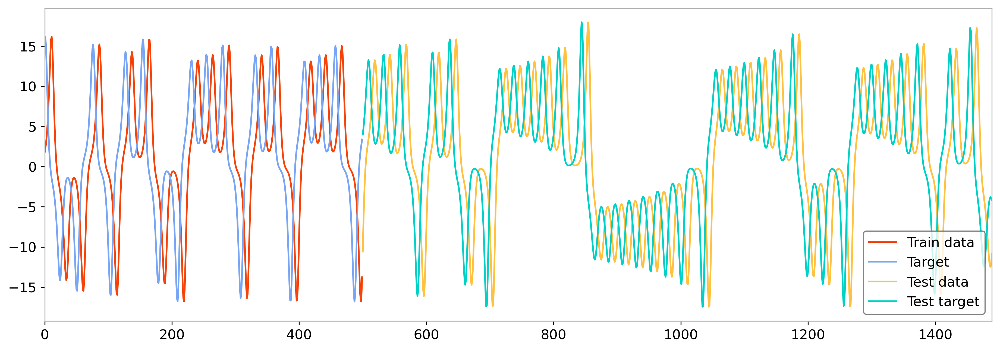

In [8]:
from reservoirpy.datasets import to_forecasting

x, y = to_forecasting(X, forecast=10)
X_train1, y_train1 = x[:2000], y[:2000]
X_test1, y_test1 = x[2000:], y[2000:]

plot_train_test(X_train1, y_train1, X_test1, y_test1)

### Some reservoir reminder

<style>
.img-center {
    display: block;
    margin-left: auto;
    margin-right: auto;
    width: 50%;
    }
</style>
<div class="img-center">
    <img src="./static/esn.svg" width="700">
</div>

$$
x[t+1]= (1 - \alpha) x[t] + \alpha f(W \cdot x[t] + W_{in} \cdot u[t] + W_{fb} \cdot y[t])
$$
$$
y[t]= W_{out}^{\intercal} x[t]
$$

### *Echo State Networks* with ReservoirPy

Models are built our of *Nodes*:


<style>
.img-center {
    display: block;
    margin-left: auto;
    margin-right: auto;
    width: 50%;
    }
</style>
<div class="img-center">
    <img src="./static/esn_nodes.svg" width="700">
</div>

<style>
.img-center {
    display: block;
    margin-left: auto;
    margin-right: auto;
    width: 50%;
    }
</style>
<div class="img-center">
    <img src="./static/esn_nodes_fb.svg" width="700">
</div>

In [9]:
def plot_results(y_pred, y_test, sample=500):
    labels = ["$x[t]$", "$y[t]$", "$z[t]$"]
    fig, axes = plt.subplots(3, 1, figsize=(13, 5))
    for i in range(3):
        ax = axes[i]
        ax.plot(np.arange(sample), y_pred[:sample, i], lw=3, label="Predictions")
        ax.plot(np.arange(sample), y_test[:sample, i], linestyle="--", lw=2, label="Ground truth")
        ax.plot(np.abs(y_test[:sample, i] - y_pred[:sample, i]), label="Absolute error")
        ax.set_ylabel(labels[i])

    plt.legend()
    plt.show()

#### ESN preparation

In [10]:
units = 100               # - number of units
leak_rate = 0.3           # - leaking rate
spectral_radius = 0.95    # - spectral radius
input_scaling = 0.5       # - input scaling (also called input gain)
connectivity = 0.1        # - recurrent weights connectivity probability
input_connectivity = 0.2  # - input weights connectivity probability
regularization = 1e-4     # - L2 regularization coeficient
transient = 100           # - number of warmup steps
seed = 1234               # - use for reproducibility

In [11]:
def reset_esn():
    from reservoirpy.nodes import Reservoir, Ridge

    reservoir = Reservoir(units, input_scaling=input_scaling, sr=spectral_radius,
                          lr=leak_rate, rc_connectivity=connectivity,
                          input_connectivity=input_connectivity, seed=seed)

    readout   = Ridge(ridge=regularization)

    return reservoir >> readout

In [12]:
from reservoirpy.nodes import Reservoir, Ridge

reservoir = Reservoir(units, input_scaling=input_scaling, sr=spectral_radius,
                      lr=leak_rate, rc_connectivity=connectivity,
                      input_connectivity=input_connectivity, seed=seed)

readout   = Ridge(ridge=regularization)

<style>
.img-center {
    display: block;
    margin-left: auto;
    margin-right: auto;
    width: 50%;
    }
</style>
<div class="img-center">
    <img src="./static/esn_nodes.svg" width="500">
</div>

In [13]:
esn = reservoir >> readout

<style>
.img-center {
    display: block;
    margin-left: auto;
    margin-right: auto;
    width: 50%;
    }
</style>
<div class="img-center">
    <img src="./static/esn_nodes_fb.svg" width="500">
</div>

In [14]:
reservoir_fb = reservoir << readout

esn_fb = reservoir_fb >> readout

#### ESN training

Learning is performed *offline*: model is updated only once, on all available training data.

In [15]:
esn.fit(X_train1, y_train1, warmup=transient);

In [16]:
def plot_readout(readout):
    Wout = readout.Wout
    bias = readout.bias
    Wout = np.r_[bias, Wout]

    fig = plt.figure(figsize=(15, 5))

    ax = fig.add_subplot(111)
    ax.grid(axis="y")
    ax.set_ylabel("Coefs. de $W_{out}$")
    ax.set_xlabel("Neurones du reservoir")
    ax.bar(np.arange(Wout.size), Wout.ravel()[::-1])

    plt.show()

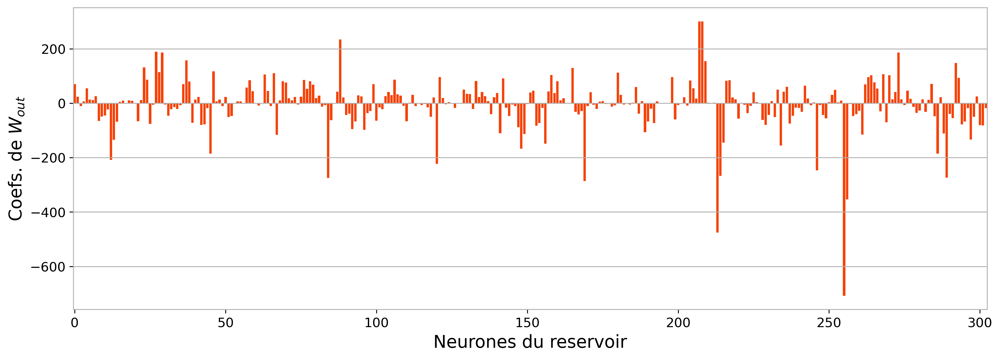

In [17]:
plot_readout(readout)

#### ESN forecast

In [18]:
y_pred1 = esn.run(X_test1)

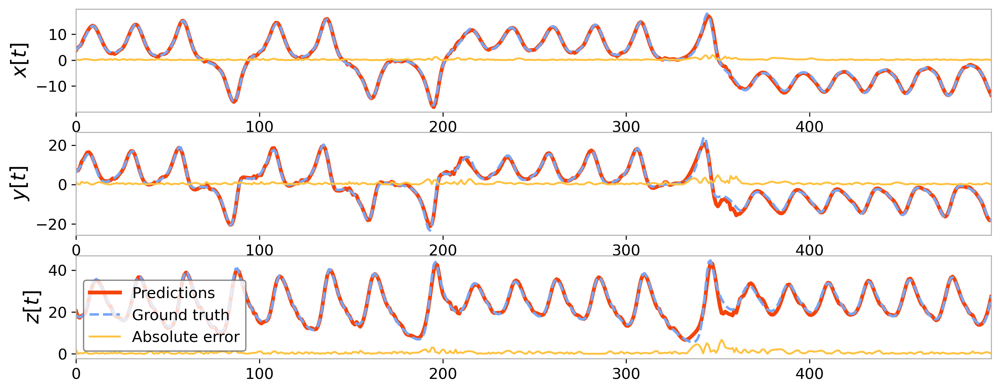

In [19]:
plot_results(y_pred1, y_test1)

Coefficient de détermination $R^2$ et erreur quadratique normalisée :

In [20]:
rsquare(y_test1, y_pred1), nrmse(y_test1, y_pred1)

(0.9966686152092658, 0.011448035696843583)

### Closed-loop reservoir<span id="gen"/>

- Train the ESN on solving a 1-step ahead prediction (learn the flow function $f(x_t) = x_{t+1})$
- Use ESN to predict on **its own activity** ("generative" mode).

<div>
    <img src="./static/generative.png" width="900">
</div>

In [21]:
units = 300               # - number of units
leak_rate = 0.3           # - leaking rate
spectral_radius = 1.25    # - spectral radius
input_scaling = 0.1       # - input scaling (also called input gain)
connectivity = 0.1        # - recurrent weights connectivity probability
input_connectivity = 0.2  # - input weights connectivity probability
regularization = 1e-4     # - L2 regularization coeficient
transient = 100           # - number of warmup steps
seed = 1234               # - use for reproducibility

In [22]:
def plot_generation(X_gen, X_t, warming_out=None, warming_inputs=None):

    nb_generations = X_gen.shape[0]
    seed_timesteps = warming_inputs.shape[0]
    labels = ["$x[t]$", "$y[t]$", "$z[t]$"]
    fig, axes = plt.subplots(3, 1, figsize=(13, 5))
    for i in range(3):
        ax = axes[i]
        ax.set_ylabel(labels[i])

        if warming_out is not None:
            ax.plot(np.hstack([warming_out[:, i], X_gen[:, i]]), label="Generated timeseries")
        else:
            ax.plot(X_gen[:, i], label="Generated timeseries")

        ax.plot(np.arange(nb_generations)+seed_timesteps, X_t[:, i], linestyle="--", label="Real timeseries")

        if warming_inputs is not None:
            ax.plot(np.arange(seed_timesteps), warming_inputs[:, i], linestyle="--", label="Warmup steps")

        if seed_timesteps > 0:
            ax.fill_between([0, seed_timesteps], *ax.get_ylim(),
                            facecolor='gray', alpha=0.5,
                            label="Warmup")

    plt.plot([], [], ' ', label=f"$R^2 = {round(rsquare(X_t, X_gen), 4)}$")
    plt.plot([], [], ' ', label=f"$NRMSE = {round(nrmse(X_t, X_gen), 4)}$")
    plt.legend(
    )
    plt.show()

def plot_attractors(X_gen, X_t, warming_inputs, warming_out):

    labels = ["$x[t]$", "$y[t]$", "$z[t]$"]
    fig = plt.figure(figsize=(13,  5))

    ax1 = fig.add_subplot((121), projection="3d")
    ax1.plot(warming_inputs[:, 0], warming_inputs[:, 1], warming_inputs[:, 2], color="gray", linestyle="--")
    ax1.plot(X_t[:, 0], X_t[:, 1], X_t[:, 2])
    ax1.set_xlabel("$x(t)$")
    ax1.set_ylabel("$y(t)$")
    ax1.set_zlabel("$z(t)$")
    ax1.set_title("Real timeseries")

    ax2 = fig.add_subplot((122), projection="3d")
    ax2.plot(warming_out[:, 0], warming_out[:, 1], warming_out[:, 2],
             color="gray", linestyle="--", label="Warmup")
    ax2.plot(X_gen[:, 0], X_gen[:, 1], X_gen[:, 2], label="Prediction")
    ax2.set_title("Forecast")


    plt.legend()
    plt.show()

#### Forecast of close future

In [23]:
esn = reset_esn()

x, y = to_forecasting(X, forecast=1)
X_train3, y_train3 = x[:2000], y[:2000]
X_test3, y_test3 = x[2000:], y[2000:]

esn = esn.fit(X_train3, y_train3, warmup=transient)

#### Closed-loop model

- 100 timesteps used as warmup;
- 300 timesteps created from reservoir dynamics, without external inputs.

In [24]:
seed_timesteps = 100

warming_inputs = X_test3[:seed_timesteps]

warming_out = esn.run(warming_inputs)  # échauffement

In [25]:
nb_generations = 500

X_gen = np.zeros((nb_generations, 3))
y = warming_out[-1]
for t in range(nb_generations):  # génération
    y = esn(y)
    X_gen[t, :] = y

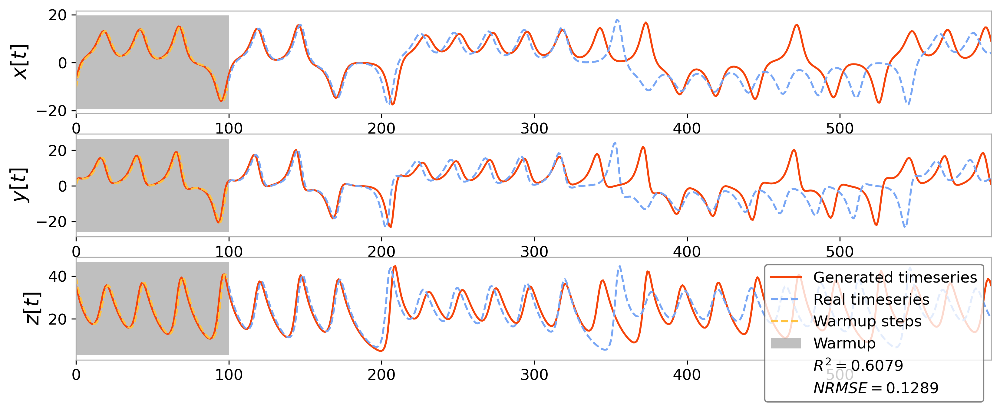

In [26]:
X_t = X_test3[seed_timesteps: nb_generations+seed_timesteps]
plot_generation(X_gen, X_t, warming_out=warming_out, warming_inputs=warming_inputs)

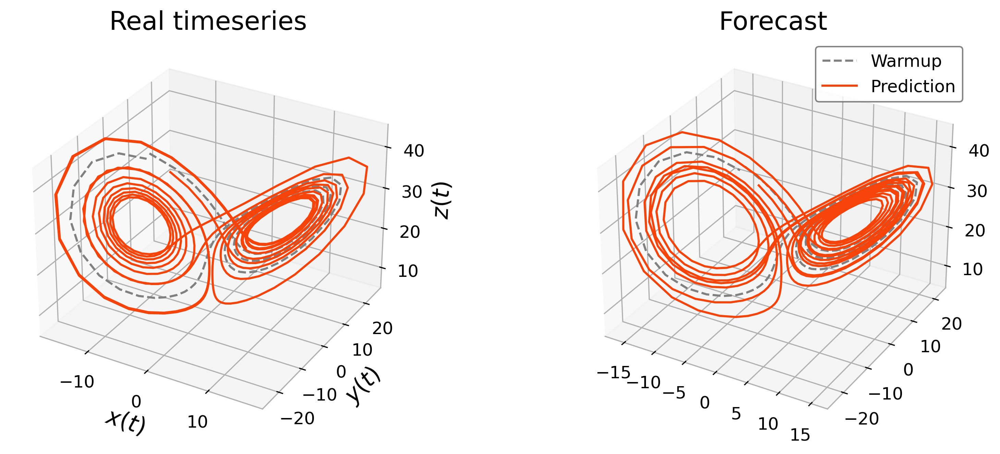

In [27]:
plot_attractors(X_gen, X_t, warming_inputs, warming_out)

## Online learning <span id="online"/>

Online learning happens **anytime** and **incrementally**.

In the following, we will use **Recursive Least Squares** algorithm.

<div>
    <img src="./static/online.png" width="700">
</div>

In [28]:
units = 100               # - number of units
leak_rate = 0.3           # - leaking rate
spectral_radius = 0.95    # - spectral radius
input_scaling = 0.5       # - input scaling (also called input gain)
connectivity = 0.1        # - recurrent weights connectivity probability
input_connectivity = 0.2  # - input weights connectivity probability
seed = 1234               # - use for reproducibility

In [29]:
from reservoirpy.nodes import RLS

reservoir = Reservoir(units, input_scaling=input_scaling, sr=spectral_radius,
                      lr=leak_rate, rc_connectivity=connectivity,
                      input_connectivity=input_connectivity, seed=seed)

readout   = RLS()  # Recursive Least Squares


esn_online = reservoir >> readout

#### Step-by-step training

In [30]:
outputs_pre = np.zeros(X_train1.shape)
for t, (x, y) in enumerate(zip(X_train1, y_train1)): # for each timestep do :
    prediction = esn_online.train(np.atleast_2d(x), np.atleast_2d(y))
    outputs_pre[t, :] = prediction

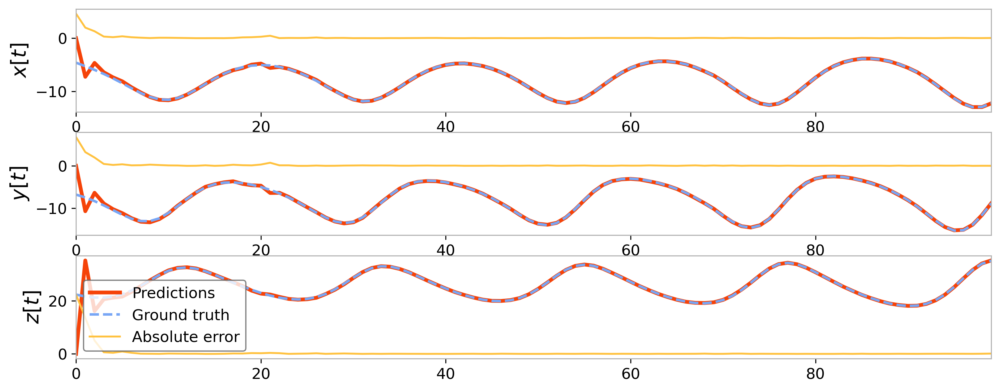

In [31]:
plot_results(outputs_pre, y_train1, sample=100)

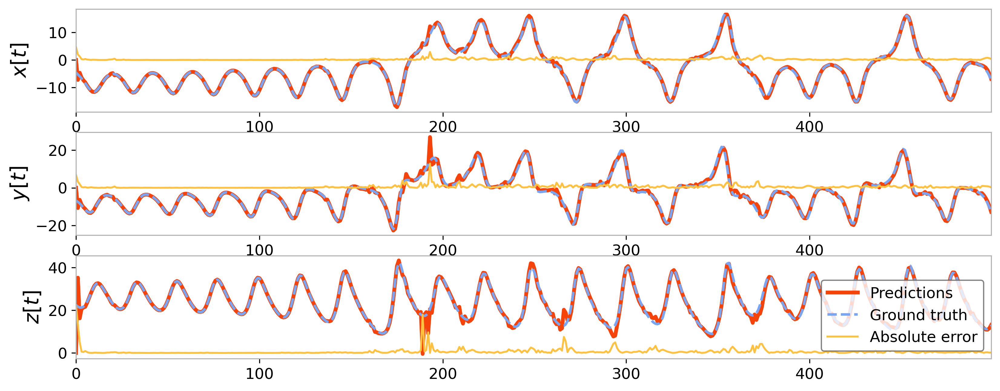

In [32]:
plot_results(outputs_pre, y_train1, sample=500)

#### Whole sequence training

In [33]:
reservoir = Reservoir(units, input_scaling=input_scaling, sr=spectral_radius,
                      lr=leak_rate, rc_connectivity=connectivity,
                      input_connectivity=input_connectivity, seed=seed)

readout   = RLS()


esn_online = reservoir >> readout

In [34]:
esn_online.train(X_train1, y_train1)

pred_online = esn_online.run(X_test1)  # Wout is now learned and fixed

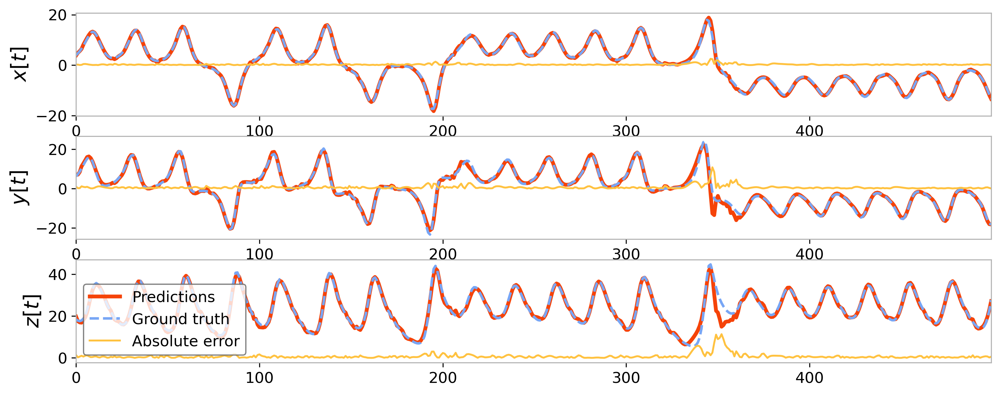

In [35]:
plot_results(pred_online, y_test1, sample=500)

Determination coefficient $R^2$ and NRMSE:

In [36]:
rsquare(y_test1, pred_online), nrmse(y_test1, pred_online)

(0.9954163172865621, 0.013428448857951327)

## Diving in the reservoir<span id="hyper"/>

In [37]:
units = 300               # - number of units
leak_rate = 0.3           # - leaking rate
spectral_radius = 1.25    # - spectral radius
input_scaling = 0.1       # - input scaling (also called input gain)
connectivity = 0.1        # - recurrent weights connectivity probability
input_connectivity = 0.2  # - input weights connectivity probability
regularization = 1e-4     # - L2 regularization coeficient
transient = 100           # - number of warmup steps
seed = 1234               # - use for reproducibility

### 1. The spectral radius

The spectral radius is **the recurrent weights matrix ($W$) largest absolute eigenvalue**.

In [38]:
states = []
radii = [0.1, 1.25, 10.0]
for sr in radii:
    reservoir = Reservoir(units, sr=sr, input_scaling=0.001, lr=leak_rate, rc_connectivity=connectivity,
                         input_connectivity=input_connectivity)

    s = reservoir.run(X_test1[:500])
    states.append(s)

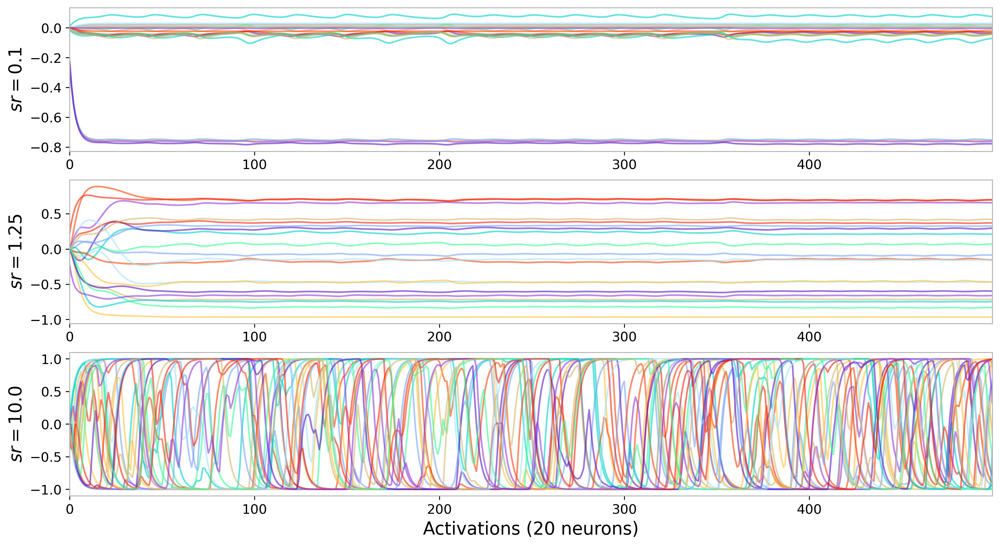

In [39]:
units_nb = 20

plt.figure(figsize=(15, 8))
for i, s in enumerate(states):
    plt.subplot(len(radii)*100+10+i+1)
    plt.plot(s[:, :units_nb], alpha=0.6)
    plt.ylabel(f"$sr={radii[i]}$")
plt.xlabel(f"Activations ({units_nb} neurons)")
plt.show()

- $-$ spectral radius $\rightarrow$ **stable** dynamics

- $+$ spectral radius $\rightarrow$ **chaotic** dynamics

### 2. The *input scaling*

It is a **coefficient applied to $W_{in}$**. It can be seen as a gain applied on inputs.

In [40]:
states = []
scalings = [0.00001, 0.001, 2.0]
for iss in scalings:
    reservoir = Reservoir(units, sr=spectral_radius, input_scaling=iss, lr=leak_rate,
                          rc_connectivity=connectivity, input_connectivity=input_connectivity)

    s = reservoir.run(X_test1[:500])
    states.append(s)

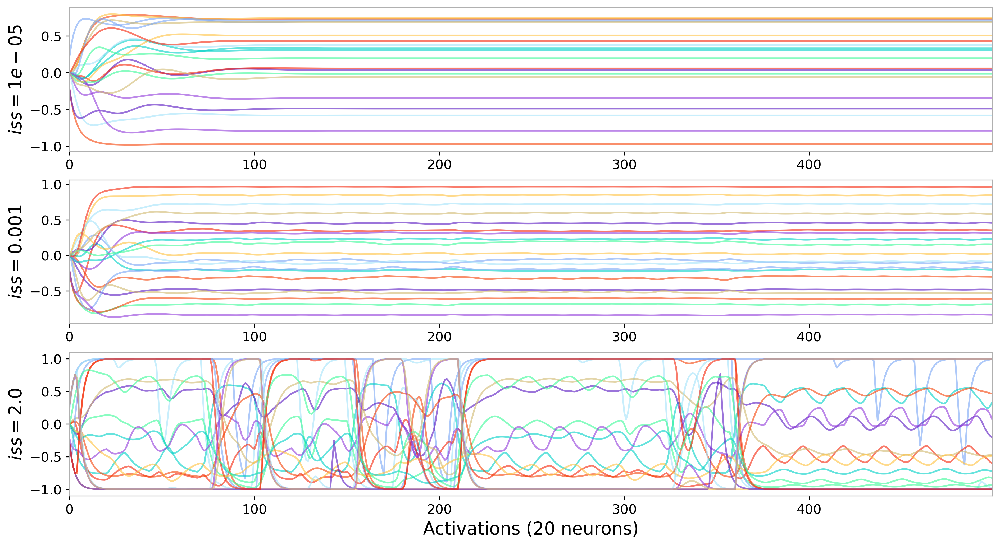

In [41]:
units_nb = 20

plt.figure(figsize=(15, 8))
for i, s in enumerate(states):
    plt.subplot(len(scalings)*100+10+i+1)
    plt.plot(s[:, :units_nb], alpha=0.6)
    plt.ylabel(f"$iss={scalings[i]}$")
plt.xlabel(f"Activations ({units_nb} neurons)")
plt.show()

Average correlation of reservoir states and inputs :

- $+$ input scaling $\rightarrow$ activity is bounded to input dynamics
- $-$ input scaling $\rightarrow$ activity is freely evolving

*Input scaling* may be used to adjust relative importance of different inputs.

### 3. The leaking rate


$$
x(t+1) =  \underbrace{\color{red}{(1 - \alpha)} x(t)}_{\text{current state}} + \underbrace{\color{red}\alpha f(u(t+1), x(t))}_{\text{new inputs}}
$$

with $\alpha \in [0, 1]$ and:

$$ f(u, x) = \tanh(W_{in} \cdotp u + W \cdotp x) $$

In [42]:
states = []
rates = [0.02, 0.2, 0.9]
for lr in rates:
    reservoir = Reservoir(units, sr=spectral_radius, input_scaling=input_scaling, lr=lr,
                          rc_connectivity=connectivity, input_connectivity=input_connectivity)

    s = reservoir.run(X_test1[:500])
    states.append(s)

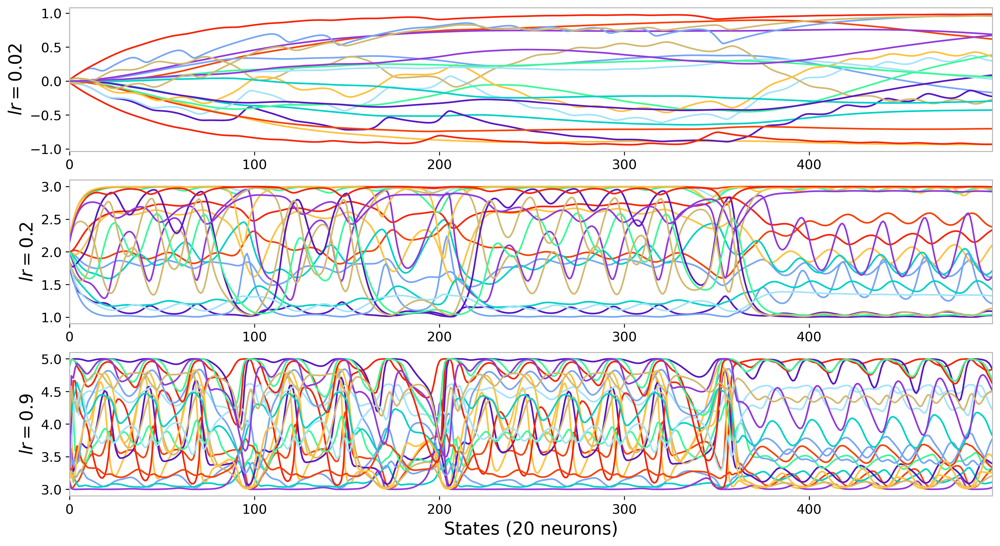

In [43]:
units_nb = 20

plt.figure(figsize=(15, 8))
for i, s in enumerate(states):
    plt.subplot(len(rates)*100+10+i+1)
    plt.plot(s[:, :units_nb] + 2*i)
    plt.ylabel(f"$lr={rates[i]}$")
plt.xlabel(f"States ({units_nb} neurons)")
plt.show()

- $+$ leaking rate $\rightarrow$ **low inertia**, short activity timescale
- $-$ leaking rate $\rightarrow$ **strong inertia**, strong activity timescale

The *leaking rate* is a proxy of the inverse of the reservoir neurons time constant.

## Use case: falling robot <span id="chapitre4"/>

<div>
    <img src="./static/sigmaban.gif" width="500">
</div>

#### Data loading and preprocessing

In [54]:
import glob
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
from joblib import delayed, Parallel
from tqdm import tqdm

In [55]:
features = ['com_x', 'com_y', 'com_z', 'trunk_pitch', 'trunk_roll', 'left_x', 'left_y',
            'right_x', 'right_y', 'left_ankle_pitch', 'left_ankle_roll', 'left_hip_pitch',
            'left_hip_roll', 'left_hip_yaw', 'left_knee', 'right_ankle_pitch',
            'right_ankle_roll', 'right_hip_pitch', 'right_hip_roll',
            'right_hip_yaw', 'right_knee']

prediction = ['fallen']
force = ['force_orientation', 'force_magnitude']

In [56]:
files = glob.glob("r4-data/experiments/*")
dfs = []

with Parallel(n_jobs=-1) as parallel:
    dfs = parallel(delayed(pd.read_csv)(f, compression="gzip", header=0, sep=",") for f in tqdm(files))

100%|██████████████████████████████████████| 1805/1805 [00:07<00:00, 247.51it/s]


In [58]:
X = []
Y = []
F = []
for i, df in enumerate(dfs):
    X.append(df[features].values)
    Y.append(df[prediction].values)
    F.append(df["force_magnitude"].values)

In [73]:
Y_target = []
for y, f in zip(Y, F):
    force_start = np.diff(f).argmax()
    y_target = np.zeros_like(y)
    y_target[force_start:] = np.max(y)
    Y_target.append(y_target)

In [109]:
def plot_robot(Y, Y_target, F):
    plt.figure(figsize=(10, 7))
    time = np.linspace(0, 3, len(Y[1]))
    plt.plot(time, Y_target[1], label="Target")
    plt.plot(time, Y[1] + 1.5, label="Fall indicator")
    plt.plot(time, F[1] / np.max(F[1]) + 3, label="Applied force", linestyle="--")
    plt.xlabel("Time (s)")
    ax = plt.gca()
    ax.spines["left"].set_color("None")
    ax.spines["top"].set_color("None")
    ax.spines["right"].set_color("None")
    ax.set_yticks([], [])
    plt.legend()
    plt.show()

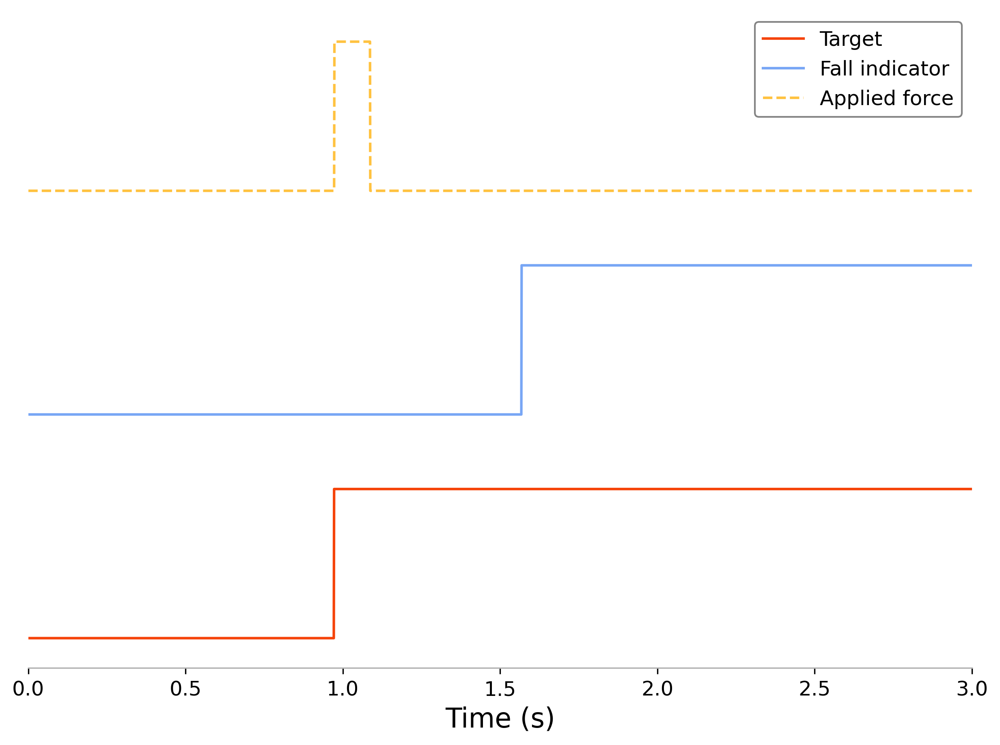

In [110]:
plot_robot(Y, Y_target, F)

#### ESN training

Using `ESN` class, an optimized and distributed implementation of Echo State Network.

In [51]:
X_train, X_test, y_train, y_test = train_test_split(X, Y_target, test_size=0.2, random_state=42)

In [52]:
from reservoirpy.nodes import ESN

reservoir = Reservoir(300, lr=0.5, sr=0.99, input_bias=False)
readout   = Ridge(ridge=1e-3)
esn = ESN(reservoir=reservoir, readout=readout, workers=-1)  # parallel computations: on

In [53]:
esn = esn.fit(X_train, y_train)

KeyboardInterrupt: 

In [ ]:
res = esn.run(X_test)

In [ ]:
from reservoirpy.observables import rmse
scores = []
for y_t, y_p in zip(y_test, res):
    score = rmse(y_t, y_p)
    scores.append(score)


filt_scores = []
for y_t, y_p in zip(y_test, res):
    y_f = y_p.copy()
    y_f[y_f > 0.5] = 1.0
    y_f[y_f <= 0.5] = 0.0
    score = rmse(y_t, y_f)
    filt_scores.append(score)

In [ ]:
def plot_robot_results(y_test, y_pred):
    for y_t, y_p in zip(y_test, y_pred):
        if y_t.max() > 0.5:
            y_shift = np.roll(y, 500)
            y_shift[:500] = 0.0

            plt.figure(figsize=(5, 2.5))
            plt.plot(y_t, label="Objectif")
            plt.plot(y_shift, label="Chute")
            plt.plot(y_p, label="Prediction")
            plt.legend()
            plt.show()
            break

In [ ]:
plot_robot_results(y_test, res)

In [ ]:
print("Mean RMSE:", f"{np.mean(scores):.4f}", "±", f"{np.std(scores):.5f}")
print("Mean RMSE (with threshold):", f"{np.mean(filt_scores):.4f}", "±", f"{np.std(filt_scores):.5f}")

In [ ]:
acc = 0.0
for y_pred, y_true in zip(res, y_test):
    true_fall = 1 if np.max(y_true) > 0.8 else 0
    pred_fall = 1 if np.max(y_pred) > 0.8 else 0
    acc += true_fall == pred_fall
print("Accuracy: ", acc / len(y_test))

## Use case: anytime decoding of canary songs<span id="chapitre5"/>

Dataset can be found on Zenodo:
https://zenodo.org/record/4736597

<style>
.img-center {
    display: block;
    margin-left: auto;
    margin-right: auto;
    width: 70%;
    }
</style>
<div class="img-center">
    <img src="./static/canary.png" width="250">
</div>

Decoded song units: *phrases*, which are repetitions of identical *syllables*.


- One label per phrase/syllable type, with phrase onset and offset time.
- One *SIL* label used to denote silence.

In [ ]:
im = plt.imread("./static/canary_outputs.png")
plt.figure(figsize=(15, 15)); plt.imshow(im); plt.axis('off'); plt.show()

#### Loading and preprocessing

In [ ]:
import os
import glob
import math
import pandas as pd
import librosa as lbr

from tqdm import tqdm
from sklearn.utils.multiclass import unique_labels
from sklearn.preprocessing import OneHotEncoder

win_length = 1024
n_fft = 2048
hop_length = 512
fmin = 500
fmax = 8000
lifter = 40
n_mfcc = 13


def load_data(directory, max_songs=100):
    audios = sorted(glob.glob(directory + "/**/*.wav", recursive=True))
    annotations = sorted(glob.glob(directory + "/**/*.csv", recursive=True))


    X = []
    Y = []
    vocab = set()

    max_songs = min(len(audios), max_songs)

    for audio, annotation, _ in tqdm(zip(audios, annotations, range(max_songs)), total=max_songs):
        df = pd.read_csv(annotation)
        wav, rate = lbr.load(audio, sr=None)
        x = lbr.feature.mfcc(y=wav, sr=rate,
                              win_length=win_length, hop_length=hop_length,
                              n_fft=n_fft, fmin=fmin, fmax=fmax, lifter=lifter,
                              n_mfcc=n_mfcc)
        delta = lbr.feature.delta(x, mode="wrap")
        delta2 = lbr.feature.delta(x, order=2, mode="wrap")

        X.append(np.vstack([x, delta, delta2]).T)

        y = [["SIL"]] * x.shape[1]

        for annot in df.itertuples():
            start = max(0, round(annot.start * rate / hop_length))
            end = min(x.shape[1], round(annot.end * rate / hop_length))
            y[start:end] = [[annot.syll]] * (end - start)
            vocab.add(annot.syll)

        Y.append(y)

    return X, Y, list(vocab)

X, Y, vocab = load_data("./canary-data")

#### One-hot encoding of labels

In [ ]:
one_hot = OneHotEncoder(categories=[vocab], sparse_output=False)

Y = [one_hot.fit_transform(np.array(y)) for y in Y]

Dans un premier (court) temps, on se limitera à traiter 100 chants. L'entraînement sera effectué sur les 90 premiers, et le test sur les 10 derniers.

Au total, il y a 459 chants, il est donc possible de varier les constructions de jeu de données, voire de tester la robustesse des résultats par validation croisée.

In [ ]:
X_train, y_train = X[:-10], Y[:-10]
X_test, y_test = X[-10:], Y[-10:]

#### ESN training

In [ ]:
from reservoirpy.nodes import ESN

units = 1000
leak_rate = 0.05
spectral_radius = 0.5
input_scaling = 0.001
connectivity = 0.1
input_connectivity = 0.1
regularization = 1e-5
seed = 1234

reservoir = Reservoir(units, sr=spectral_radius, input_scaling=input_scaling,
                      lr=leak_rate, rc_connectivity=connectivity,
                      seed=seed)

readout = Ridge(ridge=regularization)


esn = ESN(reservoir=reservoir, readout=readout, workers=-1, backend="loky")

In [ ]:
esn = esn.fit(X_train, y_train)

In [ ]:
outputs = esn.run(X_test)

In [ ]:
from sklearn.metrics import accuracy_score

scores = []
for y_t, y_p in zip(y_test, outputs):
    targets = np.vstack(one_hot.inverse_transform(y_t)).flatten()

    top_1 = np.argmax(y_p, axis=1)
    top_1 = np.array([vocab[t] for t in top_1])

    accuracy = accuracy_score(targets, top_1)

    scores.append(accuracy)

In [ ]:
scores  # for each song in the training set

In [ ]:
print("Précision moyenne :", f"{np.mean(scores):.4f}", "±", f"{np.std(scores):.5f}")

## Thank you! It is now yours to try


**Nathan Trouvain <br>
Inria, IMN, LaBRI - Bordeaux, France**

<br>
<br>
<br>
UCLA - November 14th 2023
